# SD-TSIA210 - multiclass classification task

### Doriand Petit, Priam Cardouat, David Gérard


In [116]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from imblearn.over_sampling import RandomOverSampler

from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_validate, train_test_split, GridSearchCV, learning_curve
from sklearn.metrics import confusion_matrix, f1_score
from sklearn import svm
from sklearn import tree

import graphviz
import os


!pip install tensorflow_addons
import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Input,BatchNormalization
from tensorflow.keras import backend as K
from tensorflow.keras import callbacks

import seaborn as sns

from tensorflow_addons.metrics import F1Score

from time import time 

import random


**WARNING :**
Weight initialisation in tensorflow results in different results each time kernel is restarted.

To solve this issue, we force initialisation to use the same seed at every restart.

I have tried multiple seed, this one gave good results for the neural networks. 

Seed selection could be a good way of improving the MLP's performances.


In [59]:
from numpy.random import seed
seed(1)
from tensorflow.compat.v1 import set_random_seed
set_random_seed(200)

In [15]:
# Code from scikit-learn

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]), 
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')
    
    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
            rotation_mode="anchor")
  

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax

## Dataset : HCV data Data Set 

https://archive.ics.uci.edu/ml/datasets/HCV+data

### General information

* The data set contains laboratory values of blood donors and Hepatitis C patients and demographic values like age.



<table border="1" cellpadding="6">
	<tbody><tr>
		<td bgcolor="#DDEEFF"><p class="normal"><b>Data Set Characteristics:&nbsp;&nbsp;</b></p></td>
		<td><p class="normal">Multivariate</p></td>
		<td bgcolor="#DDEEFF"><p class="normal"><b>Number of Instances:</b></p></td>
		<td><p class="normal">615</p></td>
		<td bgcolor="#DDEEFF"><p class="normal"><b>Area:</b></p></td>
		<td><p class="normal">Life</p></td>
	</tr>
	<tr>
		<td bgcolor="#DDEEFF"><p class="normal"><b>Attribute Characteristics:</b></p></td>
		<td><p class="normal">Integer, Real</p></td>
		<td bgcolor="#DDEEFF"><p class="normal"><b>Number of Attributes:</b></p></td>
		<td><p class="normal">14</p></td>
		<td bgcolor="#DDEEFF"><p class="normal"><b>Date Donated</b></p></td>
		<td><p class="normal">2020-06-10</p></td>
	</tr>
	<tr>
		<td bgcolor="#DDEEFF"><p class="normal"><b>Associated Tasks:</b></p></td>
		<td><p class="normal">Classification, Clustering</p></td>
		<td bgcolor="#DDEEFF"><p class="normal"><b>Missing Values?</b></p></td>
		<td><p class="normal">Yes</p></td>
		<td bgcolor="#DDEEFF"><p class="normal"><b>Number of Web Hits:</b></p></td>
		<td><p class="normal">38423</p></td>
	</tr>
</tbody></table>

### Attributes 

* X (Patient ID/No.)
* Category (diagnosis) (values: '0=Blood Donor', '0s=suspect Blood Donor', '1=Hepatitis', '2=Fibrosis', '3=Cirrhosis')
* Age (in years)
* Sex (f,m)
* ALB (numerical)
* ALP (numerical)
* ALT (numerical)
* AST (numerical)
* BIL (numerical)
* CHE (numerical)
* CHOL (numerical)
* CREA (numerical)
* GGT (numerical)
* PROT (numerical)

### Goal :
**Predict the category from all other attributes.**

### Data importation

In [71]:
raw_data = pd.read_csv('./hcvdat0.csv')
raw_data

,Unnamed: 0,Category,Age,Sex,ALB,ALP,ALT,AST,BIL,CHE,CHOL,CREA,GGT,PROT
0,1,0=Blood Donor,32,m,38.5,52.5,7.7,22.1,7.5,6.93,3.23,106.0,12.1,69.0
1,2,0=Blood Donor,32,m,38.5,70.3,18.0,24.7,3.9,11.17,4.80,74.0,15.6,76.5
2,3,0=Blood Donor,32,m,46.9,74.7,36.2,52.6,6.1,8.84,5.20,86.0,33.2,79.3
3,4,0=Blood Donor,32,m,43.2,52.0,30.6,22.6,18.9,7.33,4.74,80.0,33.8,75.7
4,5,0=Blood Donor,32,m,39.2,74.1,32.6,24.8,9.6,9.15,4.32,76.0,29.9,68.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
610,611,3=Cirrhosis,62,f,32.0,416.6,5.9,110.3,50.0,5.57,6.30,55.7,650.9,68.5
611,612,3=Cirrhosis,64,f,24.0,102.8,2.9,44.4,20.0,1.54,3.02,63.0,35.9,71.3
612,613,3=Cirrhosis,64,f,29.0,87.3,3.5,99.0,48.0,1.66,3.63,66.7,64.2,82.0
613,614,3=Cirrhosis,46,f,33.0,NaN,39.0,62.0,20.0,3.56,4.20,52.0,50.0,71.0


## A - Exploring the dataset, preprocessing 

### Category
Cathegory is our label for the classification task. There are **5 classes of patients** : Blood Donor, suspect Blood Donor, Hepatitis, Fibrosis and Cirrhosis, each having a label $\in${'0=Blood Donor', '0s=suspect Blood Donor', '1=Hepatitis', '2=Fibrosis', '3=Cirrhosis'}.


#### Classes to categorical
As for the Sex feature, we must transform the labels to numerical values distinguising the 5 classes.

**WARNING** : We don't want to introduce a metric in the classification. A patient with label 3 is not "closer" from a patient with label 0 than a patient with label 5.

This is why our labels will be arrays of size 5. 

A patient of class $i$ will have label $y = \begin{pmatrix}  0\\ ...\\ y_i = 1 \\ ...\\ 0 \end{pmatrix}$

In [72]:
#Tranforming Category to numerical labels (0;1;2;3;4)


def category_to_num(category):
    switcher={
                '0=Blood Donor':0,
                '0s=suspect Blood Donor':1,
                '1=Hepatitis':2,
                '2=Fibrosis':3,
                '3=Cirrhosis':4
             }
    return switcher.get(category)
        

    
for i in range(615):
    if type(raw_data['Category'][i])!=int:
        raw_data['Category'][i] = category_to_num(raw_data['Category'][i])
        


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


#### Overrepresented class

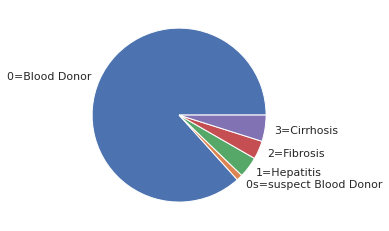

In [73]:
y = raw_data['Category'].to_numpy().astype(float)
del raw_data['Category']
labels_classes = ['0=Blood Donor', '0s=suspect Blood Donor', '1=Hepatitis', '2=Fibrosis', '3=Cirrhosis']
hist = np.histogram(y,bins = 5)[0]
plt.pie(hist, labels = labels_classes)
plt.show() 

As shown by the pie chart, class 0 is overrepresentated in the data. This is an issue because an algorithm who would predict all the time class 0 would technically have a great accuracy, but wouldn't have any use.

To remedy this issue, **we will oversample classes 1 to 4 in the training set** (see the end of this part). 

### Patient ID

In the dataset, patients are ordered by Category. **We must take away the patient ID feature from the dataset**, otherwise the algorithm would give false diagnosis based on futur patients ID.

In [74]:
del raw_data['Unnamed: 0']

### Sexs

In the data set, sexs are represented by letters f and m. To be used for classification, we must transform this to a numerical value. I chose to give m the value -1 and f the value 1. This allows both sex to have the same weight in classification.

In [75]:
#Transforming Sex to numerical value (m -> -1 ; f -> 1)
def sex_to_num(sex):
    switcher={
                'm':-1,
                'f':1
             }
    return switcher.get(sex)


for i in range(615):
    if type(raw_data['Sex'][i])!=int:
        raw_data['Sex'][i] = sex_to_num(raw_data['Sex'][i])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


### NaN values
In this dataset, we have NaN values. This is an issues because some function we will later use won't work if a NaN value is inputed.

We will replace NaN values by the average of the colomn in the training test.

## Other features
Other features are numerical data on the patients. We will see in part B which are the more significant to provide a adequate diagnostic. 

For now, we will simply standardise and normalise the data for better optimisation performances.

In [76]:
X = raw_data.to_numpy().astype(float)
keys = raw_data.keys()
#TRAIN TEST SPLIT
X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.25, random_state=42)

#COMPUTE COLUMNS'S MEAN IN THE TRAINING SET AND REPLACE NAN VALUES BY THE MEAN

X_train = pd.DataFrame(X_train)#switch to pandas (numpy is not great for NaN values)
X_test = pd.DataFrame(X_test)


for key in X_train.keys():
    train_mean = X_train[key].mean()
    X_train[key] = X_train[key].fillna(train_mean)
    X_test[key] = X_test[key].fillna(train_mean)

X_train = X_train.to_numpy().astype(float)
X_test = X_test.to_numpy().astype(float)

    
#STANDARDISE AND NORMALISE THE DATA
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)





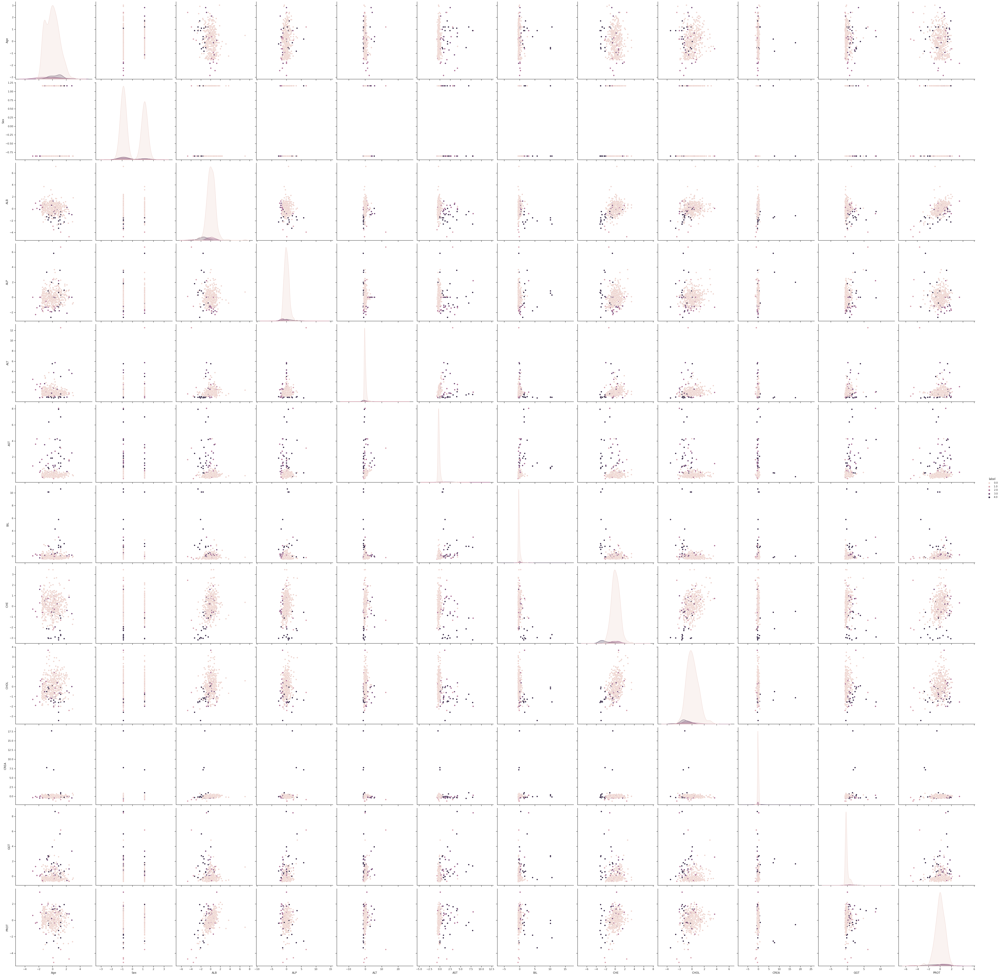

In [77]:
#https://stackoverflow.com/questions/22943894/class-labels-in-pandas-scattermatrix

sns.set_theme(style="ticks")
plot_train = pd.DataFrame(X_train,columns=keys)

plot_train['label'] = pd.Series(y_train).astype('float64')

sns.pairplot(plot_train, hue='label',height=5)

Due to the over-representation of class 0, it's not easy to distinguish which features will be important for classification and which won't.

We will plot the same matrix with the oversampled data in order to see if some features can already be pre-selected as more importants.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


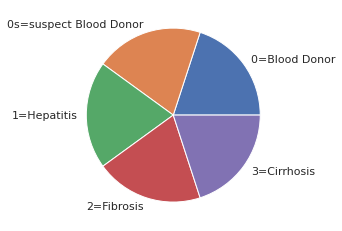

In [78]:
#OVERSAMPLING
ros = RandomOverSampler(random_state=42)
X_train, y_train = ros.fit_resample(X_train, y_train)

labels_classes = ['0=Blood Donor', '0s=suspect Blood Donor', '1=Hepatitis', '2=Fibrosis', '3=Cirrhosis']
hist = np.histogram(y_train,bins = 5)[0]
plt.pie(hist, labels = labels_classes)
plt.show() 

#TO CATEGORICAL
y_train = tf.keras.utils.to_categorical(y_train,num_classes = 5)
y_test = tf.keras.utils.to_categorical(y_test,num_classes = 5)

## B - Feature selection
Let's begin by ploting the pairplot matrix of the oversampled dataset.

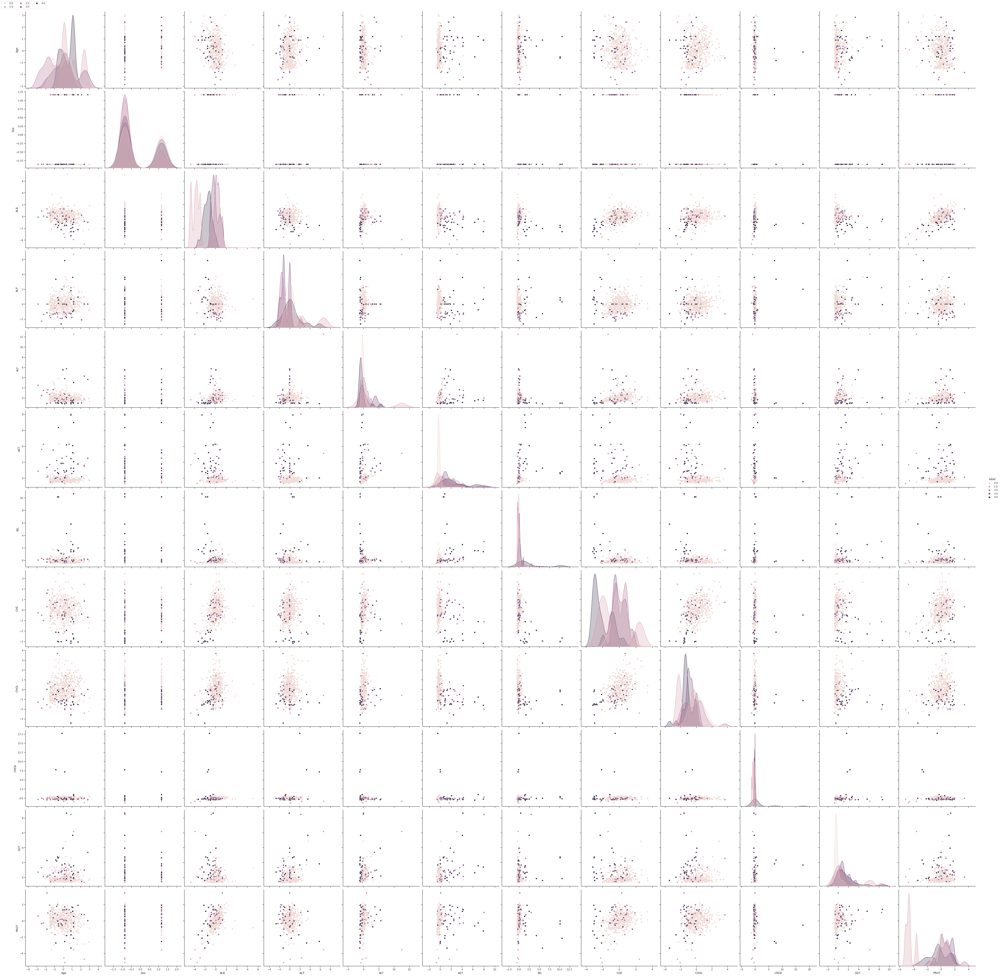

In [82]:
#https://stackoverflow.com/questions/22943894/class-labels-in-pandas-scattermatrix

sns.set_theme(style="ticks")
plot_train = pd.DataFrame(X_train,columns=keys)

plot_train['label'] = pd.Series(y_train.argmax(-1)).astype('float64')

g = sns.pairplot(plot_train, hue='label',height=5)
handles = g._legend_data.values()
labels = g._legend_data.keys()
g.fig.legend(handles=handles, labels=labels, loc='upper left', ncol=3)

The diagonal graphs represents the histograms of the classes in each features. They can give us an idea of which features will be helpfull in separating classes from one another, and which won't.


**Interesting features (6):**
* Age : It appears that patients with Hepathitis are younger than other patients.
* ALB : Suspected donors almost all have lower ALBs than other patients.
* AST : Blood donors's AST level has a very narrow distribution compared to all other classes.
* CHE : CHE can be very usefull distinguishing patients with Cirrhosis and suspected donors from the rest of the patients.
* GGT : Blood donors's GGT level has a very narrow distribution compared to all other classes.
* PROT : Suspected donors almost all have lower PROT levels than other patients.

**Very uninteresting features (2):**

* Sex : All cathegories of patiens follow the same distribution in this feature.
* CREA : All cathegories of patiens follow very similar distributions in this feature.

### Performance Metric
To asses the performance of our models, we will use the **f1 score**. 

$F_{1}=2*\frac{\text{Precision} \times \text{Recall}}{\text{Precision} + \text{Recall}}$

The F1 score is the harmonic mean of the precision and recall. **The highest possible value of an F-score is 1.0, indicating perfect precision and recall**, and the lowest possible value is 0, if either the precision or the recall is zero.



As one of our classes is over-represented, we will use the **weighted f1 metric**, which calculate the f1 sore for each label, and find their average weighted by support (the number of true instances for each label).


### PCA
Some of the features in our dataset might be correlated. In order to improve our accuracy and reduce computation time, we will use **principal component analysis**.

PCA requires to know how many features we want to keep. To know that, we will perform tests on different algorithms.

Text(0, 0.5, 'Cumulative explained variance')

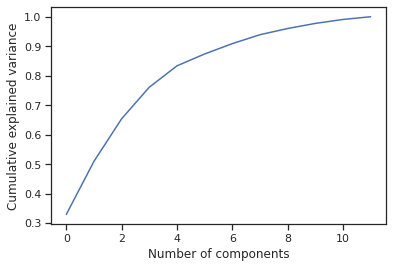

In [41]:
pca = PCA(n_components = 12)
pca.fit(X_train)

plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

As seen on the graph, **6 features are enough to represent more than 90% of the Cumulative explained variance**. 
This is coherent with what we saw while looking the classes ditribution on each feature.

## C - Multi Layers Perceptron

### Network




Training history



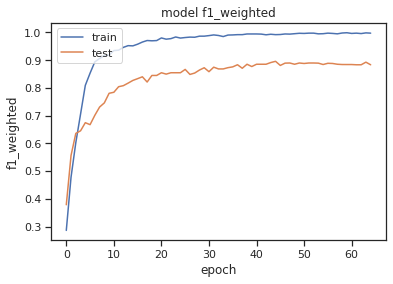

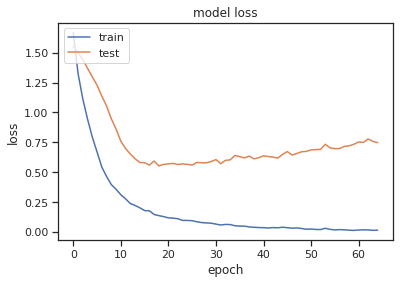

f1 test score : 0.9092293610357528
Normalized confusion matrix
[[0.984      0.         0.016      0.         0.        ]
 [0.         0.66666667 0.33333333 0.         0.        ]
 [0.         0.         0.77777778 0.11111111 0.11111111]
 [0.42857143 0.         0.14285714 0.28571429 0.14285714]
 [0.3        0.         0.         0.2        0.5       ]]


Training time : 32.87812423706055


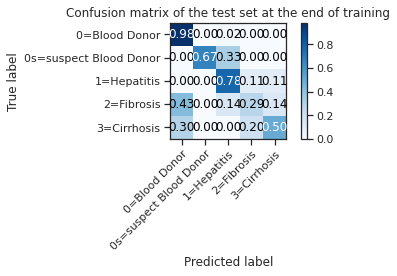

In [60]:
# Network Parameters
n_hidden_1 = 12 # 1st layer number of neurons
n_hidden_2 = 15 # 2nd layer number of neurons
n_hidden_3 = 15 # 3nd layer number of neurons



n_input = X_train.shape[1]
n_classes = y_train.shape[1] # 5 classes


tf.keras.backend.clear_session()

model_mlp = Sequential([
    Dense(n_hidden_1,activation = 'relu',name = "Dense1",input_shape = [n_input]),
    BatchNormalization(),
    Dense(n_hidden_2,activation = 'relu',name = "Dense2"),
    BatchNormalization(),
    Dense(n_hidden_3,activation = 'relu',name = "Dense3"),
    BatchNormalization(),

    Dense(n_classes,activation = 'softmax',name = "out")
    
])


model_mlp.compile(loss='categorical_crossentropy', optimizer='adam',metrics=[F1Score(num_classes=5,average = 'weighted')],run_eagerly=True)


# Run optimisation algorithm
n_epochs = 100
batch_size = 100


earlystopping = callbacks.EarlyStopping(monitor ="val_f1_score", 
                                        mode ="max", patience = 20, 
                                        restore_best_weights = True, baseline = 0.02)


plt.close()

begin = time()
history_training1 = model_mlp.fit(X_train, y_train, epochs=n_epochs,batch_size=batch_size, validation_data = (X_test,y_test), verbose = 0,callbacks =[earlystopping])
end = time()
print()
print("========================================")
print("Training history")
print()

# summarize history for accuracy
plt.plot(history_training1.history['f1_score'])
plt.plot(history_training1.history['val_f1_score'])
plt.title('model f1_weighted')
plt.ylabel('f1_weighted')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


# summarize history for loss
plt.plot(history_training1.history['loss'])
plt.plot(history_training1.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


y_pred = model_mlp.predict(X_test)
y_pred_classes = y_pred.argmax(axis=-1)
y_test_classes = y_test.argmax(axis=-1)
print
print("f1 test score : "+ str(f1_score(y_pred_classes,y_test_classes,average='weighted')))
    
plot_confusion_matrix(confusion_matrix(y_test_classes, y_pred_classes), classes=labels_classes,normalize=True, title= "Confusion matrix of the test set at the end of training") 

print()
print()
print("Training time : "+str(end-begin))    

#### Observations :


**Good things :**
* We almoste have no false positives (almost all blood donor are cathegorised as such).
* Diagnal coefficients of the confusion matrix are all greater or equal than the coefficients on the same line or column, exept for Fibrosis patients.
* The confusion matrix sparcity is high (a lot of coefficients = 0 outside the diagonal).

**Bad things :**
* 33% of suspect blood donor are classified as Cirrhosis patients.
* 43% of Fibrosis patients are classified as Blood donors.

**What to do next? :**
* Try to apply PCA to the data then use the same network.
* Find the best number of features to keep.


#### PCA with 8 features 

In [61]:
pca.set_params(n_components = 8)
pca.fit(X_train)

X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)



Training history



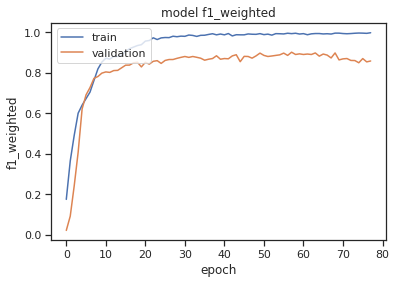

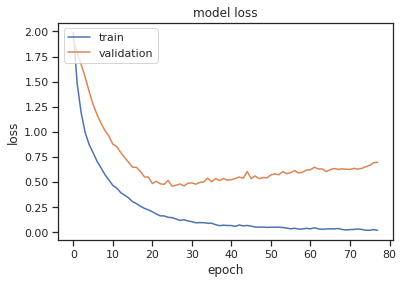

0.9037122078609539
Normalized confusion matrix
[[0.976      0.         0.008      0.016      0.        ]
 [0.         0.66666667 0.         0.33333333 0.        ]
 [0.22222222 0.11111111 0.55555556 0.11111111 0.        ]
 [0.57142857 0.         0.         0.42857143 0.        ]
 [0.1        0.1        0.         0.1        0.7       ]]


Training time : 39.215362548828125


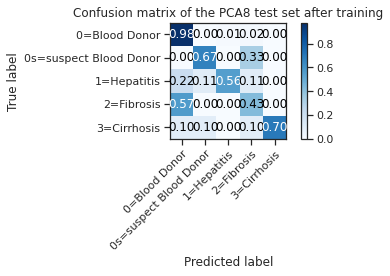

In [62]:
# Network Parameters
n_hidden_1 = 12 # 1st layer number of neurons
n_hidden_2 = 15 # 2nd layer number of neurons
n_hidden_3 = 15 # 3nd layer number of neurons


n_input = X_train_pca.shape[1]
n_classes = y_train.shape[1] # 5 classes

tf.keras.backend.clear_session()

earlystopping = callbacks.EarlyStopping(monitor ="val_f1_score", 
                                        mode ="max", patience = 20, 
                                        restore_best_weights = True, baseline = 0.02)


model_mlp_pca8 = Sequential([
    Dense(n_hidden_1,activation = 'relu',name = "Dense1",input_shape = [n_input]),
    BatchNormalization(),
    Dense(n_hidden_2,activation = 'relu',name = "Dense2"),
    BatchNormalization(),
    Dense(n_hidden_3,activation = 'relu',name = "Dense3"),
    BatchNormalization(),
    Dense(n_classes,activation = 'softmax',name = "Dense5")
    
])



model_mlp_pca8.compile(loss='categorical_crossentropy', optimizer='adam',metrics=[F1Score(num_classes=5,average = 'weighted')],run_eagerly=True)




# Run optimisation algorithm
n_epochs = 90
batch_size = 100

plt.close()
begin = time()
history_training1 = model_mlp_pca8.fit(X_train_pca, y_train, epochs=n_epochs,batch_size=batch_size, validation_data = (X_test_pca,y_test), verbose = 0,callbacks =[earlystopping])
end = time()
print()
print("========================================")
print("Training history")
print()
    
# summarize history for f1 score
plt.plot(history_training1.history['f1_score'])
plt.plot(history_training1.history['val_f1_score'])
plt.title('model f1_weighted')
plt.ylabel('f1_weighted')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()


# summarize history for loss
plt.plot(history_training1.history['loss'])
plt.plot(history_training1.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

y_pred = model_mlp_pca8.predict(X_test_pca)
y_pred_classes = y_pred.argmax(axis=-1)
y_test_classes = y_test.argmax(axis=-1)

    
print(f1_score(y_pred_classes,y_test_classes,average='weighted'))
    
plot_confusion_matrix(confusion_matrix(y_test_classes, y_pred_classes), classes=labels_classes,normalize=True, title= "Confusion matrix of the PCA8 test set after training") 
print()
print()
print("Training time : "+str(end-begin))   

#### Observations :

**Good things :**
* Accuracy on Fibrosis and Cirrhosis detection has increased.

**Bad Things :**
* The proportion of suspect blood donors classified as Fibrosis patients went from 0 to 0.33.
* 57% of the Fibrosis patients are still classified as Blood donor.

#### PCA with 6 features

In [85]:
pca.set_params(n_components = 6)
pca.fit(X_train)

X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)


Training history



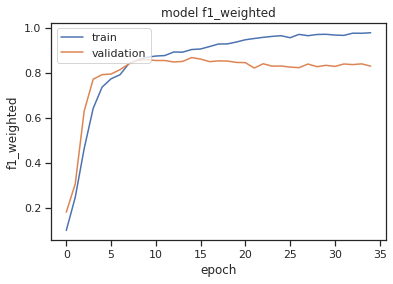

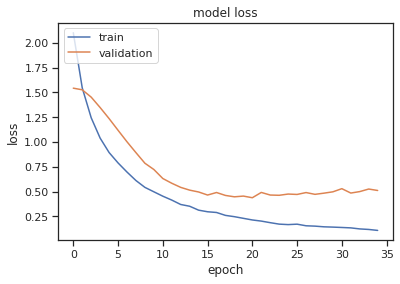

0.8593196372340369
Normalized confusion matrix
[[0.952      0.008      0.008      0.032      0.        ]
 [0.         0.33333333 0.         0.33333333 0.33333333]
 [0.22222222 0.         0.44444444 0.22222222 0.11111111]
 [0.42857143 0.         0.         0.57142857 0.        ]
 [0.         0.2        0.2        0.1        0.5       ]]


Training time : 18.057203769683838


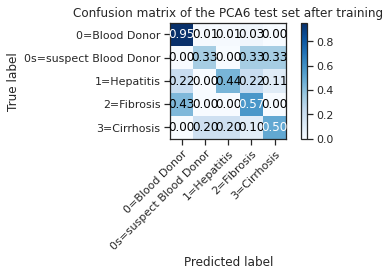

In [86]:
# Network Parameters
n_hidden_1 = 12 # 1st layer number of neurons
n_hidden_2 = 15 # 2nd layer number of neurons
n_hidden_3 = 15 # 3nd layer number of neurons


n_input = X_train_pca.shape[1]
n_classes = y_train.shape[1] # 5 classes

tf.keras.backend.clear_session()

earlystopping = callbacks.EarlyStopping(monitor ="val_f1_score", 
                                        mode ="max", patience = 20, 
                                        restore_best_weights = True, baseline = 0.02)


model_mlp_pca6 = Sequential([
    Dense(n_hidden_1,activation = 'relu',name = "Dense1",input_shape = [n_input]),
    BatchNormalization(),
    Dense(n_hidden_2,activation = 'relu',name = "Dense2"),
    BatchNormalization(),
    Dense(n_hidden_3,activation = 'relu',name = "Dense3"),
    BatchNormalization(),
    Dense(n_classes,activation = 'softmax',name = "Dense5")
    
])



model_mlp_pca6.compile(loss='categorical_crossentropy', optimizer='adam',metrics=[F1Score(num_classes=5,average = 'weighted')],run_eagerly=True)




# Run optimisation algorithm
n_epochs = 90
batch_size = 100

plt.close()
begin = time()
history_training1 = model_mlp_pca6.fit(X_train_pca, y_train, epochs=n_epochs,batch_size=batch_size, validation_data = (X_test_pca,y_test), verbose = 0,callbacks =[earlystopping])
end = time()
print()
print("========================================")
print("Training history")
print()
    
# summarize history for f1 score
plt.plot(history_training1.history['f1_score'])
plt.plot(history_training1.history['val_f1_score'])
plt.title('model f1_weighted')
plt.ylabel('f1_weighted')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()


# summarize history for loss
plt.plot(history_training1.history['loss'])
plt.plot(history_training1.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

y_pred = model_mlp_pca6.predict(X_test_pca)
y_pred_classes = y_pred.argmax(axis=-1)
y_test_classes = y_test.argmax(axis=-1)

    
print(f1_score(y_pred_classes,y_test_classes,average='weighted'))
    
plot_confusion_matrix(confusion_matrix(y_test_classes, y_pred_classes), classes=labels_classes,normalize=True, title= "Confusion matrix of the PCA6 test set after training") 
print()
print()
print("Training time : "+str(end-begin))   


#### Observations : 
**Good things :**
* Diagonal coeffecients are all greater or equel than other coefficents on the same line or column.

**Bad things :**
* The matrix is less sparse than for PCA with 8 features.
* Accuracy on suspect blood donor classification was divided by 2.

#### PCA with 4 features

In [66]:
pca.set_params(n_components = 4)
pca.fit(X_train)

X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)


Training history



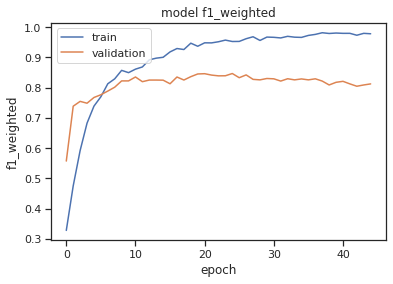

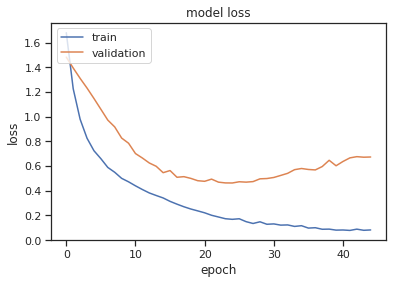

0.8543676476863771
Normalized confusion matrix
[[0.96       0.008      0.016      0.016      0.        ]
 [0.         0.         0.         0.         1.        ]
 [0.         0.         0.66666667 0.22222222 0.11111111]
 [0.42857143 0.         0.14285714 0.         0.42857143]
 [0.1        0.         0.2        0.2        0.5       ]]


Training time : 23.217299699783325


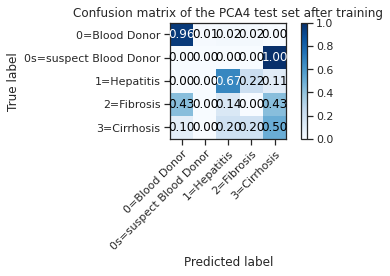

In [65]:
# Network Parameters
n_hidden_1 = 12 # 1st layer number of neurons
n_hidden_2 = 15 # 2nd layer number of neurons
n_hidden_3 = 15 # 3nd layer number of neurons


n_input = X_train_pca.shape[1]
n_classes = y_train.shape[1] # 5 classes

tf.keras.backend.clear_session()

earlystopping = callbacks.EarlyStopping(monitor ="val_f1_score", 
                                        mode ="max", patience = 20, 
                                        restore_best_weights = True, baseline = 0.02)


model_mlp_pca4 = Sequential([
    Dense(n_hidden_1,activation = 'relu',name = "Dense1",input_shape = [n_input]),
    BatchNormalization(),
    Dense(n_hidden_2,activation = 'relu',name = "Dense2"),
    BatchNormalization(),
    Dense(n_hidden_3,activation = 'relu',name = "Dense3"),
    BatchNormalization(),
    Dense(n_classes,activation = 'softmax',name = "Dense5")
    
])



model_mlp_pca4.compile(loss='categorical_crossentropy', optimizer='adam',metrics=[F1Score(num_classes=5,average = 'weighted')],run_eagerly=True)




# Run optimisation algorithm
n_epochs = 90
batch_size = 100

plt.close()
begin = time()
history_training1 = model_mlp_pca4.fit(X_train_pca, y_train, epochs=n_epochs,batch_size=batch_size, validation_data = (X_test_pca,y_test), verbose = 0,callbacks =[earlystopping])
end = time()
print()
print("========================================")
print("Training history")
print()
    
# summarize history for f1 score
plt.plot(history_training1.history['f1_score'])
plt.plot(history_training1.history['val_f1_score'])
plt.title('model f1_weighted')
plt.ylabel('f1_weighted')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()


# summarize history for loss
plt.plot(history_training1.history['loss'])
plt.plot(history_training1.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

y_pred = model_mlp_pca4.predict(X_test_pca)
y_pred_classes = y_pred.argmax(axis=-1)
y_test_classes = y_test.argmax(axis=-1)

    
print(f1_score(y_pred_classes,y_test_classes,average='weighted'))
    
plot_confusion_matrix(confusion_matrix(y_test_classes, y_pred_classes), classes=labels_classes,normalize=True, title= "Confusion matrix of the PCA4 test set after training") 
print()
print()
print("Training time : "+str(end-begin))   


#### Observations : 

**Bad things :**
* No suspect blood donors or Fibrosis patients were correctly classified.
* All suspect blood donors were classified as Cirrhosis patients.



### MLP & PCA - Conclusion 

The best option is PCA with 8 features. The MLP gives an f1 score of 0.9 on the test set, and a fairely good confusion matrix.

Best test f1 score :  0.9037122078609539

Normalized confusion matrix
[[0.976      0.         0.008      0.016      0.        ]
 [0.         0.66666667 0.         0.33333333 0.        ]
 [0.22222222 0.11111111 0.55555556 0.11111111 0.        ]
 [0.57142857 0.         0.         0.42857143 0.        ]
 [0.1        0.1        0.         0.1        0.7       ]]


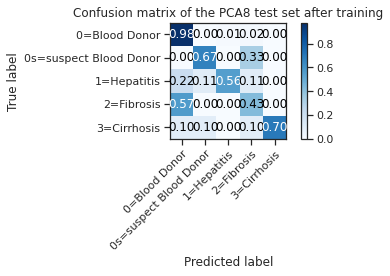

In [91]:
pca.set_params(n_components = 8)
pca.fit(X_train)

X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

#SELECTED SOLUTION
y_pred = model_mlp_pca8.predict(X_test_pca)
y_pred_classes = y_pred.argmax(axis=-1)
y_test_classes = y_test.argmax(axis=-1)

    
print("Best test f1 score : ",f1_score(y_pred_classes,y_test_classes,average='weighted'))
print()
    
plot_confusion_matrix(confusion_matrix(y_test_classes, y_pred_classes), classes=labels_classes,normalize=True, title= "Confusion matrix of the PCA8 test set after training") 

## D - Multi-class SVM

SVMs are usually used for binary classification problems with non linear decision boundries. However, they can also be applied to multy class classification problems with a “one-versus-one” approach for multi-class classification.

**Scikit learn's svm.SVC class** uses this approach.



### SVM's hyperparametters

We will use gridsearch to find the best hyperparametters for our problem.

* **kernel :** Specifies the kernel type to be used in the algorithm. It must be one of ‘linear’, ‘poly’, ‘rbf’, ‘sigmoid’, ‘precomputed’ or a callable.
* **degree :** Degree of the polynomial kernel function (‘poly’). Ignored by all other kernels.

* **gamma :** Kernel coefficient for ‘rbf’, ‘poly’ and ‘sigmoid’.

* **coef0 :** Independent term in kernel function.

* **C :** Regularization parameter.

### Grid search of optimal hyperparametters


Fitting 3 folds for each of 960 candidates, totalling 2880 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  54 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 296 tasks      | elapsed:   13.8s
[Parallel(n_jobs=-1)]: Done 702 tasks      | elapsed:   34.9s
[Parallel(n_jobs=-1)]: Done 1768 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 2463 tasks      | elapsed:  2.3min


The best degree is 7
best kernel :  poly
best degree :  7
best gamma :  None
best coef0 :  0
best C :  10


f1 score of the best SVM estimator found by grid search :  0.8734098785311725
Normalized confusion matrix
[[0.984      0.         0.016      0.         0.        ]
 [0.33333333 0.33333333 0.         0.         0.33333333]
 [0.66666667 0.         0.22222222 0.11111111 0.        ]
 [0.71428571 0.         0.14285714 0.14285714 0.        ]
 [0.5        0.1        0.         0.1        0.3       ]]


[Parallel(n_jobs=-1)]: Done 2880 out of 2880 | elapsed:  3.4min finished


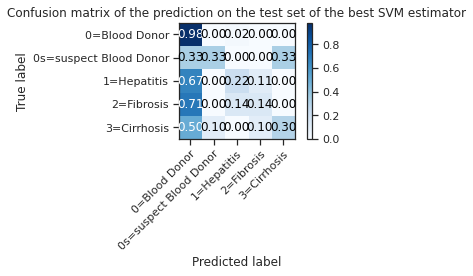

In [54]:
parameters = {'kernel':['rbf','poly','sigmoid','linear'],'degree':[3,4,5,6,7],'gamma':['scale', 'auto'],'coef0':[0,1,2,5,8,15],'C': [0.1, 1, 10, 100]}
clf = svm.SVC(decision_function_shape='ovo',random_state = 42)
grid = GridSearchCV(clf, parameters, cv=3, n_jobs=-1,verbose = 2, scoring = 'f1_weighted')
grid.fit(X_train, y_train.argmax(axis=-1))

print('The best degree is', grid.best_params_.get('degree'))
print('best kernel : ', grid.best_params_.get('kernel'))
print('best degree : ', grid.best_params_.get('degree'))
print('best gamma : ', grid.best_params_.get('gama'))
print('best coef0 : ', grid.best_params_.get('coef0'))
print('best C : ', grid.best_params_.get('C'))

print()
print("=================================")
print()

BestSVM=grid.best_estimator_
y_pred_classes = BestSVM.predict(X_test)
y_test_classes = y_test.argmax(axis=-1)

    
print("f1 score of the best SVM estimator found by grid search : ",f1_score(y_pred_classes,y_test_classes,average='weighted'))
    
plot_confusion_matrix(confusion_matrix(y_test_classes, y_pred_classes), classes=labels_classes,normalize=True, title= "Confusion matrix of the prediction on the test set of the best SVM estimator") 

#### Observation : 
* We have a lot of false negatives.
* Once again, a lot of Cirrhosis are miss-classified as Suspect blood donors.

### SVM with PCA
Let's try to use the best hyperparamettors on data which underwent PCA.

#### PCA with 8 features

In [94]:
pca.set_params(n_components = 8)
pca.fit(X_train)

X_train_pca = pca.transform(X_train).astype(float)
X_test_pca = pca.transform(X_test).astype(float)


Fitting 3 folds for each of 960 candidates, totalling 2880 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 298 tasks      | elapsed:   12.5s
[Parallel(n_jobs=-1)]: Done 704 tasks      | elapsed:   32.8s
[Parallel(n_jobs=-1)]: Done 1770 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 2453 tasks      | elapsed:  2.7min


The best degree is 5
best kernel :  poly
best degree :  5
best gamma :  None
best coef0 :  8
best C :  0.1


f1 score of the best SVM estimator found by grid search :  0.886045290139809
Normalized confusion matrix
[[0.976      0.         0.024      0.         0.        ]
 [0.         0.33333333 0.         0.33333333 0.33333333]
 [0.22222222 0.         0.55555556 0.22222222 0.        ]
 [0.42857143 0.         0.28571429 0.28571429 0.        ]
 [0.1        0.1        0.         0.2        0.6       ]]


[Parallel(n_jobs=-1)]: Done 2880 out of 2880 | elapsed:  4.5min finished


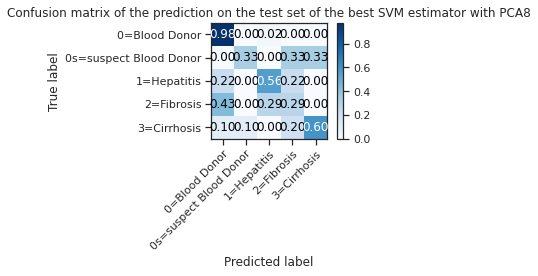

In [96]:
parameters = {'kernel':['rbf','poly','sigmoid','linear'],'degree':[3,4,5,6,7],'gamma':['scale', 'auto'],'coef0':[0,1,2,5,8,15],'C': [0.1, 1, 10, 100]}
clf8 = svm.SVC(decision_function_shape='ovo',random_state = 42)
grid = GridSearchCV(clf8, parameters, cv=3, n_jobs=-1,verbose = 2, scoring = 'f1_weighted')
grid.fit(X_train_pca, y_train.argmax(axis=-1))

print('The best degree is', grid.best_params_.get('degree'))
print('best kernel : ', grid.best_params_.get('kernel'))
print('best degree : ', grid.best_params_.get('degree'))
print('best gamma : ', grid.best_params_.get('gama'))
print('best coef0 : ', grid.best_params_.get('coef0'))
print('best C : ', grid.best_params_.get('C'))

print()
print("=================================")
print()

svm_PCA8=grid.best_estimator_
y_pred_classes = svm_PCA8.predict(X_test_pca)
y_test_classes = y_test.argmax(axis=-1)

    
print("f1 score of the best SVM estimator found by grid search : ",f1_score(y_pred_classes,y_test_classes,average='weighted'))

    
plot_confusion_matrix(confusion_matrix(y_test_classes, y_pred_classes), classes=labels_classes,normalize=True, title= "Confusion matrix of the prediction on the test set of the best SVM estimator with PCA8")

This is much better ! There are a lot less false negatives. Accuracy on Cirrhosis classification is quite good. However, Fibrosis and suspect Blood donor 's accuracies are terrible.

## E - Decision trees

In [136]:
clf = tree.DecisionTreeClassifier(criterion = 'gini', random_state=0)
clf = clf.fit(X_train, y_train)

plt.figure(figsize=(250,100))
a = tree.plot_tree(clf,
               feature_names = keys, 
               class_names=labels_classes,
               filled = True)



0.853651860461199
Normalized confusion matrix
[[0.968      0.008      0.016      0.008      0.        ]
 [0.66666667 0.33333333 0.         0.         0.        ]
 [0.44444444 0.         0.11111111 0.44444444 0.        ]
 [0.42857143 0.         0.42857143 0.14285714 0.        ]
 [0.2        0.         0.         0.2        0.6       ]]



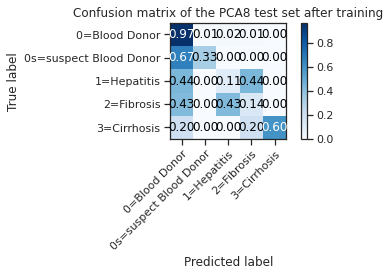

In [137]:
y_pred = clf.predict(X_test)
y_pred_classes = y_pred.argmax(axis=-1)
y_test_classes = y_test.argmax(axis=-1)

    
print(f1_score(y_pred_classes,y_test_classes,average='weighted'))
    
plot_confusion_matrix(confusion_matrix(y_test_classes, y_pred_classes), classes=labels_classes,normalize=True, title= "Confusion matrix of the tree") 
print()

We have a lot of false negatives.

Let's see if we can use cross validation to find the optimal depth and improve our results.

The depth-21 tree achieves the best mean cross-validation accuracy 96.81373 +/- 6.13039% on training dataset


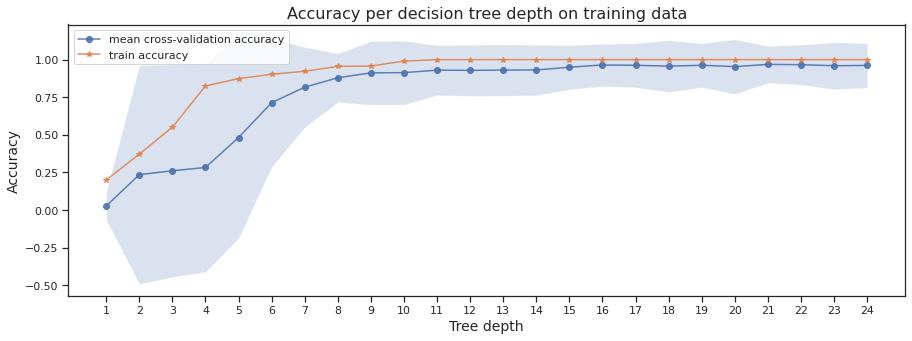

In [115]:


plt.close("all")
# function for fitting trees of various depths on the training data using cross-validation
def run_cross_validation_on_trees(X, y, tree_depths, cv=5, scoring='accuracy'):
    cv_scores_list = []
    cv_scores_std = []
    cv_scores_mean = []
    accuracy_scores = []
    for depth in tree_depths:
        tree_model = tree.DecisionTreeClassifier(criterion='gini', max_depth=depth)
        cv_scores = cross_val_score(tree_model, X, y, cv=cv, scoring=scoring)
        cv_scores_list.append(cv_scores)
        cv_scores_mean.append(cv_scores.mean())
        cv_scores_std.append(cv_scores.std())
        accuracy_scores.append(tree_model.fit(X, y).score(X, y))
    cv_scores_mean = np.array(cv_scores_mean)
    cv_scores_std = np.array(cv_scores_std)
    accuracy_scores = np.array(accuracy_scores)
    return cv_scores_mean, cv_scores_std, accuracy_scores
  
# function for plotting cross-validation results
def plot_cross_validation_on_trees(depths, cv_scores_mean, cv_scores_std, accuracy_scores, title):
    fig, ax = plt.subplots(1,1, figsize=(15,5))
    ax.plot(depths, cv_scores_mean, '-o', label='mean cross-validation accuracy', alpha=0.9)
    ax.fill_between(depths, cv_scores_mean-2*cv_scores_std, cv_scores_mean+2*cv_scores_std, alpha=0.2)
    ylim = plt.ylim()
    ax.plot(depths, accuracy_scores, '-*', label='train accuracy', alpha=0.9)
    ax.set_title(title, fontsize=16)
    ax.set_xlabel('Tree depth', fontsize=14)
    ax.set_ylabel('Accuracy', fontsize=14)
    ax.set_ylim(ylim)
    ax.set_xticks(depths)
    ax.legend()

# fitting trees of depth 1 to 24
sm_tree_depths = range(1,25)
sm_cv_scores_mean, sm_cv_scores_std, sm_accuracy_scores = run_cross_validation_on_trees(X_train, y_train, sm_tree_depths)

# plotting accuracy
plot_cross_validation_on_trees(sm_tree_depths, sm_cv_scores_mean, sm_cv_scores_std, sm_accuracy_scores, 
                               'Accuracy per decision tree depth on training data')

idx_max = sm_cv_scores_mean.argmax()
sm_best_tree_depth = sm_tree_depths[idx_max]
sm_best_tree_cv_score = sm_cv_scores_mean[idx_max]
sm_best_tree_cv_score_std = sm_cv_scores_std[idx_max]
print('The depth-{} tree achieves the best mean cross-validation accuracy {} +/- {}% on training dataset'.format(
      sm_best_tree_depth, round(sm_best_tree_cv_score*100,5), round(sm_best_tree_cv_score_std*100, 5)))



Reducing the debth of our tree is not a solution to improve accuracy since our previous tree had a debth <21.

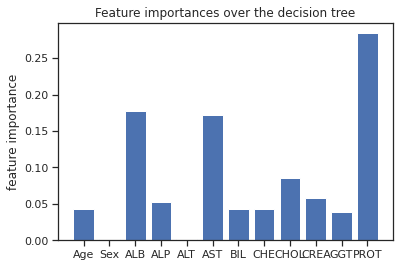

training score  1.0
testing score  0.8311688311688312


In [125]:
plt.close("all")
features = []
index = []
for i,n in enumerate(clf.feature_importances_):
    if n!=0:
        features.append(n)
        index.append(keys[i])
plt.close("all")
plt.bar(index, features)
plt.xticks(range(len(index)), index)
plt.ylabel("feature importance")
plt.title("Feature importances over the decision tree")
plt.show()
print("training score ", clf.score(X_train, y_train))
print("testing score ", clf.score(X_test, y_test))

PROT, ALB and AST are the most important features selected by the tree. This is coherent with our previous analysis.

### Choice of the best impurity criterion and stopping criterion


In [138]:
parameters = {'criterion':['gini', 'entropy'], 'max_depth':range(1,24)}
clf = GridSearchCV(tree.DecisionTreeClassifier(), parameters)
clf.fit(X_train, y_train)
tree_model = clf.best_estimator_
print ("Mean cross-validated score of the best_estimator", clf.best_score_, "best parameters ", clf.best_params_) 

Mean cross-validated score of the best_estimator 0.9754901960784312 best parameters  {'criterion': 'entropy', 'max_depth': 22}


In [139]:
plt.close("all")

plt.figure(figsize=(250,100))
a = tree.plot_tree(tree_model,
               feature_names = keys, 
               class_names=labels_classes,
               filled = True)

Best test f1 score :  0.8656522552202697
Normalized confusion matrix
[[0.968      0.008      0.016      0.         0.008     ]
 [0.33333333 0.33333333 0.         0.33333333 0.        ]
 [0.44444444 0.         0.22222222 0.33333333 0.        ]
 [0.42857143 0.         0.28571429 0.28571429 0.        ]
 [0.2        0.         0.         0.2        0.6       ]]



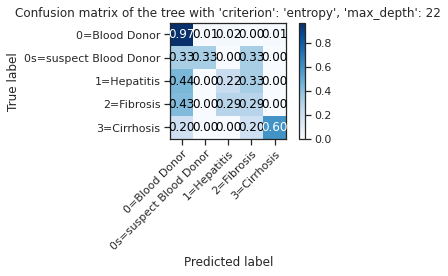

In [142]:
y_pred = clf.predict(X_test)
y_pred_classes = y_pred.argmax(axis=-1)
y_test_classes = y_test.argmax(axis=-1)

    
print("Best test f1 score : ",f1_score(y_pred_classes,y_test_classes,average='weighted'))
    
plot_confusion_matrix(confusion_matrix(y_test_classes, y_pred_classes), classes=labels_classes,normalize=True, title= "Confusion matrix of the tree with 'criterion': 'entropy', 'max_depth': 22") 
print()

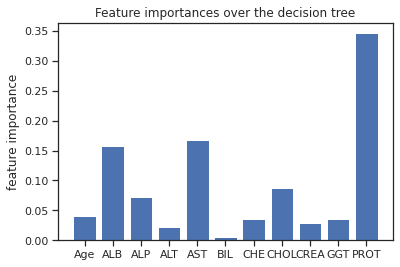

training score  1.0
testing score  0.8571428571428571


In [141]:
plt.close("all")
features = []
index = []
for i,n in enumerate(tree_model.feature_importances_):
    if n!=0:
        features.append(n)
        index.append(keys[i])
plt.close("all")
plt.bar(index, features)
plt.xticks(range(len(index)), index)
plt.ylabel("feature importance")
plt.title("Feature importances over the decision tree")
plt.show()
print("training score ", clf.score(X_train, y_train))
print("testing score ", clf.score(X_test, y_test))

### Decision tree with PCA8

In [143]:
pca.set_params(n_components = 8)
pca.fit(X_train)

X_train_pca = pca.transform(X_train).astype(float)
X_test_pca = pca.transform(X_test).astype(float)

In [148]:
parameters = {'criterion':['gini', 'entropy'], 'max_depth':range(1,24)}
clf = GridSearchCV(tree.DecisionTreeClassifier(), parameters)
clf.fit(X_train_pca, y_train)
tree_model = clf.best_estimator_
print ("Mean cross-validated score of the best_estimator", clf.best_score_, "best parameters ", clf.best_params_) 


plt.close("all")

plt.figure(figsize=(250,100))
a = tree.plot_tree(tree_model, 
               class_names=labels_classes,
               filled = True)





Mean cross-validated score of the best_estimator 0.9857843137254901 best parameters  {'criterion': 'gini', 'max_depth': 20}


Best test f1 score :  0.8731609386383674
Normalized confusion matrix
[[0.96       0.         0.024      0.016      0.        ]
 [0.         0.33333333 0.66666667 0.         0.        ]
 [0.22222222 0.         0.44444444 0.22222222 0.11111111]
 [0.42857143 0.         0.         0.42857143 0.14285714]
 [0.3        0.         0.1        0.         0.6       ]]



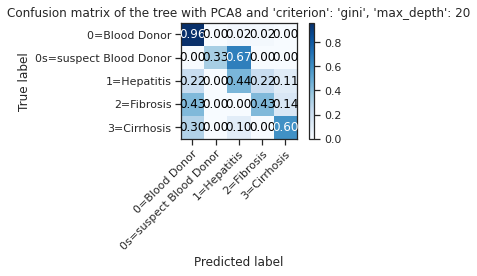

In [151]:
y_pred = tree_model.predict(X_test_pca)
y_pred_classes = y_pred.argmax(axis=-1)
y_test_classes = y_test.argmax(axis=-1)

    
print("Best test f1 score : ",f1_score(y_pred_classes,y_test_classes,average='weighted'))
    
plot_confusion_matrix(confusion_matrix(y_test_classes, y_pred_classes), classes=labels_classes,normalize=True, title= "Confusion matrix of the tree with PCA8 and 'criterion': 'gini', 'max_depth': 20") 
print()

### Decision tree with PCA6

In [153]:
pca.set_params(n_components = 6)
pca.fit(X_train)

X_train_pca = pca.transform(X_train).astype(float)
X_test_pca = pca.transform(X_test).astype(float)

In [154]:
parameters = {'criterion':['gini', 'entropy'], 'max_depth':range(1,24)}
clf = GridSearchCV(tree.DecisionTreeClassifier(), parameters)
clf.fit(X_train_pca, y_train)
tree_model = clf.best_estimator_
print ("Mean cross-validated score of the best_estimator", clf.best_score_, "best parameters ", clf.best_params_) 


plt.close("all")

plt.figure(figsize=(250,100))
a = tree.plot_tree(tree_model, 
               class_names=labels_classes,
               filled = True)


Mean cross-validated score of the best_estimator 0.9813725490196077 best parameters  {'criterion': 'gini', 'max_depth': 16}


Best test f1 score :  0.8555807646169092
Normalized confusion matrix
[[0.944      0.         0.032      0.024      0.        ]
 [0.         0.33333333 0.         0.         0.66666667]
 [0.22222222 0.         0.44444444 0.22222222 0.11111111]
 [0.57142857 0.         0.         0.28571429 0.14285714]
 [0.         0.         0.3        0.         0.7       ]]



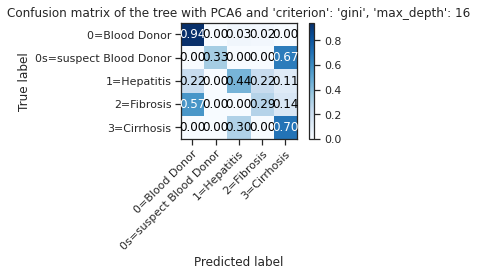

In [156]:
y_pred = tree_model.predict(X_test_pca)
y_pred_classes = y_pred.argmax(axis=-1)
y_test_classes = y_test.argmax(axis=-1)

    
print("Best test f1 score : ",f1_score(y_pred_classes,y_test_classes,average='weighted'))
    
plot_confusion_matrix(confusion_matrix(y_test_classes, y_pred_classes), classes=labels_classes,normalize=True, title= "Confusion matrix of the tree with PCA6 and 'criterion': 'gini', 'max_depth': 16") 
print()

PCA8 gives the best decision tree regarding to f1 scoring of the test set.

## F - Conclusion 

**Best f1 score with MLP : 0.90**

Settings :
* PCA with 8 features.
* Epochs of training : 80 - 60 = 20 epochs.
* batch_size : 100

**Best f1 score with SVM : 0.87**

Settings : 
* PCA with 8 features.
* kernel :  poly
* degree :  5
* gamma :  None
* coef0 :  8
* C :  0.1

**Best f1 score with decision tree : 0.87**

Settings :
* PCA with 8 features.
* criterion : gini
* max_depth : 20





The MLP is the best classifier on this multi-class classification problem.